## Exercise 1

In [1]:
import sys 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
import seaborn as sns
from scipy.stats import poisson  
from scipy.integrate import odeint
from numpy import linalg as la
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
plt.rcParams.update({'font.size': 7, 'font.style': 'normal', 'font.family':'serif'})

In [2]:
provinces = pd.read_csv('data_provinces.csv').drop('Unnamed: 0', axis=1)

In [3]:
provinces.head()


,LO,PV,SO,MN,MI,CO,BS,MB,LC,CR,BG,VA
0,0,0,0,1,0,1,2,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0


In [4]:
susceptibles = pd.DataFrame({'Province': ['LO', 'PV', 'SO', 'MN', 'MI', 'CO', 'BS', 'MB', 'LC', 'CR', 'BG', 'VA'],
                             'Population': [44928, 71882, 21477, 48835, 1406242, 85543, 196340, 124840, 48058, 72399, 120783, 80724]})
susceptibles.set_index('Province', inplace=True)

In [5]:
train = pd.DataFrame({'LO': [64], 'PV': [68], 'SO':[74], 'MN': [74], 'MI': [68], 'CO': [68], 'BS': [68], 'MB': [68], 'LC': [70], 'CR': [66], 'BG': [66], 'VA': [73]})

In [6]:
susceptibles

,Population
Province,
LO,44928
PV,71882
SO,21477
MN,48835
MI,1406242
CO,85543
BS,196340
MB,124840
LC,48058


In [7]:
provinces_cum = np.cumsum(provinces, axis=0)

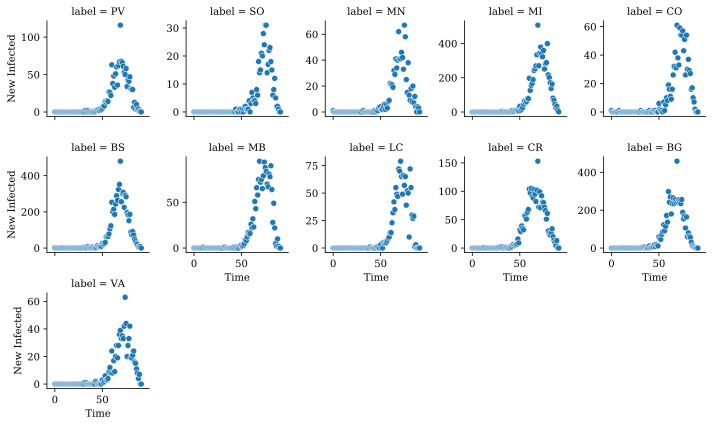

In [8]:
# PLOT
D = provinces.iloc[:,1:].stack().reset_index()
D.columns = ['time_step', 'label', 'value']


g = sns.FacetGrid(D, col="label", height=2, col_wrap=5, sharey= False)
g.map(sns.scatterplot, "time_step", 'value')
g.set_axis_labels("Time", "New Infected");

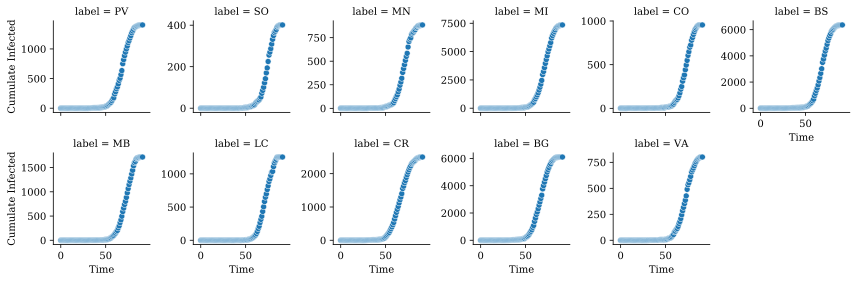

In [9]:
# PLOT
D = provinces_cum.iloc[:,1:].stack().reset_index()
D.columns = ['time_step', 'label', 'value']


g = sns.FacetGrid(D, col="label", height=2, col_wrap=6, sharey= False)
g.map(sns.scatterplot, "time_step", 'value')
g.set_axis_labels("Time", "Cumulate Infected");

#### SEIRD equation

In [10]:
def SEIRD_eq(INPUT, t, beta, gamma, alpha, cd):
    S, E, I, D, R = INPUT
    N = S+E+I+R+D
    dS_dt = -(beta*S*I/N)
    dE_dt =  (beta*S*I/N) - (alpha*E)
    dI_dt =  (alpha*E) - (gamma*I) - cd * I
    dD_dt =  cd * I
    dR_dt =  gamma*I 
    return dS_dt, dE_dt, dI_dt, dD_dt, dR_dt

Define the parameters common to every province, looking for optimal values of R0 between 1 and 3, and of alphas between 0 and 1, leaving fixed the covid mortality rate and also the recovery rate, as we know average duration of recovery


In [11]:
ndays = len(provinces)
t = np.arange(1, ndays+1, 1)
d = 7 
R0s = np.arange(1.51, 3, 0.01) 
alphas = np.arange(0.01, 1, 0.1)
cd = 0.004
gamma= 1/d - cd

Write a loop to test the parameters beta and alpha, compute the error with the MSE and plot result for every province

In [12]:
def train_model(province, plot=False):
    N = int(susceptibles.loc[province])
    y0 = N-1 ,1, 0, 0, 0 
    MSEs = []  # store all MSEs
    I_hats = [] # store all the I_daily of the model that you test
    R0_ = []
    alpha_ = []
    I_hat_ = []


    for R0 in R0s:
        beta= R0*(gamma + cd)
        alphas_ = []
        MSEs_ = []
        I_hats_ = []

        for alpha in alphas:
            RES = odeint(SEIRD_eq, y0, t, args=(beta, gamma, alpha, cd))
            S, E, I_hat, D, R = RES.T
            I_daily = (I_hat[1:]+R[1:] + D[1:])-(I_hat[:-1]+R[:-1] + D[:-1])

            true_data = provinces[:int(train[province])][province]

            MSE = np.sqrt(sum((I_daily[:int(train[province])]-true_data)**2)/len(true_data))
            MSEs_.append(MSE)
            R0_.append(R0)
            alphas_.append(alpha)
            I_hats_.append(I_daily)

        ind = np.argmin(np.array(MSEs_))
        alpha_.append(alphas_[ind])
        MSEs.append(MSEs_[ind])
        I_hat_.append(I_hats_[ind])



    cal = pd.DataFrame({'R0': R0s, 'MSE': MSEs, 'I_hat': I_hat_, 'alpha': alpha_, 'city':province})
    best_model = cal.loc[cal['MSE'].idxmin()]

    if plot:
        fig, axs = plt.subplots(1,3, facecolor='w', figsize=(10,3))
        axs[0].set_title('Best Model: \n R0: {}, MSE:{}, alpha:{}, city:{}'.format(round(best_model['R0'], 2), round(best_model['MSE'],2), round(best_model['alpha'],2), province))
        axs[0].scatter(t[:int(train[province])], provinces[:int(train[province])][province], color = 'b', label = 'I_data')
        axs[0].plot(t[:-1] ,best_model['I_hat'], alpha=1, lw=2, label='I_daily', color = 'darkred')

        axs[1].set_title('Models Tested')
        axs[1].plot(t[:-1], I_hat_[0], alpha=0.5,  color = 'k', lw=1, label ='models tested' )
        for R0, I in zip(R0s, I_hat_[1:]):
            if R0 == best_model['R0']:
                axs[1].plot(t[:-1], I, c = 'darkred', lw=5, label = 'best model')
            else:
                axs[1].plot(t[:-1], I, alpha=0.05,  color = 'k', lw=1)

        axs[2].set_title('MSEs')
        axs[2].scatter(cal['R0'], cal['MSE'], color = 'k' , s =1 )
        axs[2].scatter(best_model['R0'], best_model['MSE'], color = 'darkred' , s =50, label='min MSE' )
        axs[2].axvline(x= best_model['R0'], ymin=0, ymax=2, c= 'b')
        axs[2].set_xlabel('R0s')
        axs[2].set_ylabel('MSEs')

        for i in range(3):
            axs[i].legend(fancybox = True)
            for spine in ('top', 'right'): 
                axs[i].spines[spine].set_visible(False)

        fig.tight_layout()
    print('BEST MODEL: city: {} , R0: {}, MSE:{}, alpha: {}'.format(best_model['city'],round(best_model['R0'], 4), round(best_model['MSE'],4),round(best_model['alpha'],4) ))
    return best_model['I_hat']

BEST MODEL: city: LO , R0: 1.86, MSE:10.4568, alpha: 0.91
BEST MODEL: city: PV , R0: 2.44, MSE:5.8794, alpha: 0.21
BEST MODEL: city: SO , R0: 2.65, MSE:2.5783, alpha: 0.11
BEST MODEL: city: MN , R0: 2.28, MSE:4.7375, alpha: 0.21
BEST MODEL: city: MI , R0: 2.86, MSE:14.7058, alpha: 0.21
BEST MODEL: city: CO , R0: 2.97, MSE:3.6986, alpha: 0.11
BEST MODEL: city: BS , R0: 2.93, MSE:19.1425, alpha: 0.21
BEST MODEL: city: MB , R0: 2.39, MSE:5.1346, alpha: 0.21
BEST MODEL: city: LC , R0: 2.36, MSE:5.8079, alpha: 0.21
BEST MODEL: city: CR , R0: 2.35, MSE:7.7502, alpha: 0.31
BEST MODEL: city: BG , R0: 2.36, MSE:23.4073, alpha: 0.41
BEST MODEL: city: VA , R0: 2.96, MSE:3.3001, alpha: 0.11


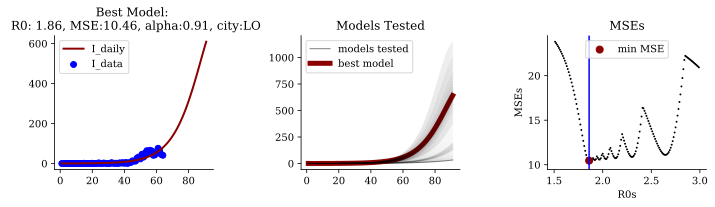

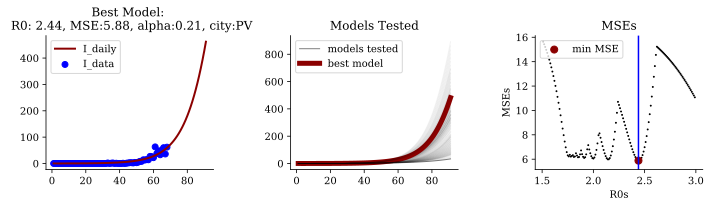

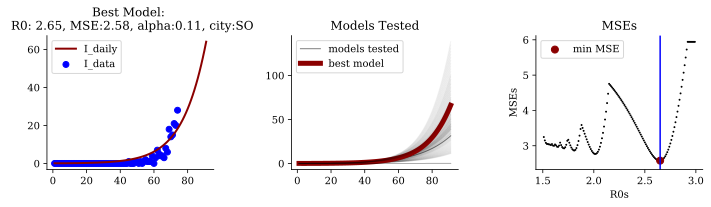

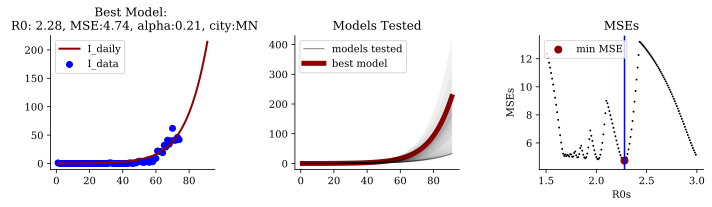

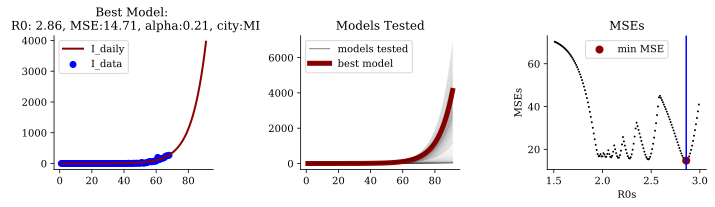

...

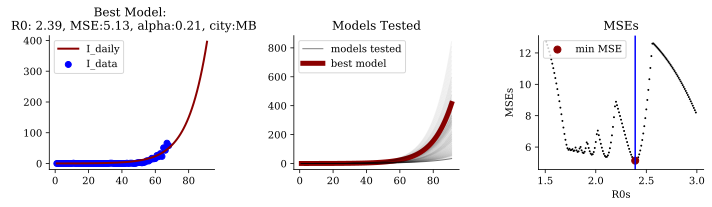

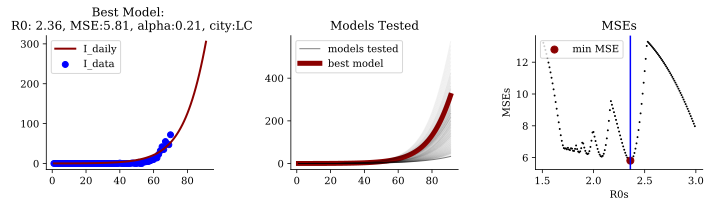

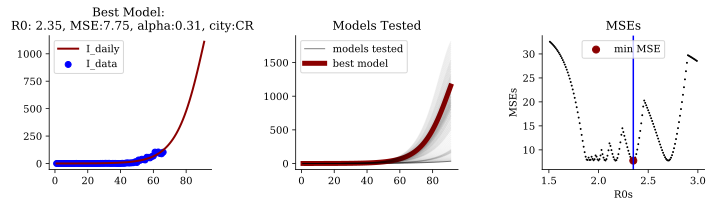

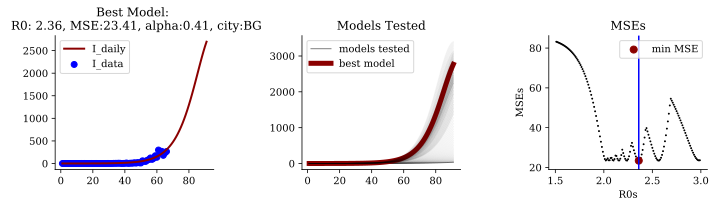

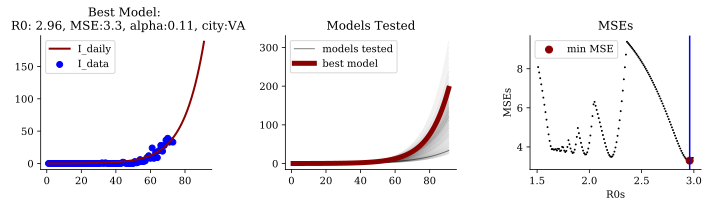

In [13]:
for province in provinces.columns.values:
    train_model(province=province, plot=True)

We see how the fit is good for the part of the data we have trained and how it would have predicted the following datapoints with the current parameters. However, we don't expect the curve to resemble the true behavior, because restrictions were not inforced and given the R0 greater than 1 it will show an exponential growth in the future. Let'see how different is the current prediction from the true data for a given province.

BEST MODEL: city: BG , R0: 2.36, MSE:23.4073, alpha: 0.41


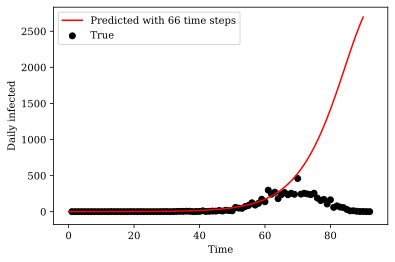

In [14]:
plt.plot(train_model('BG', plot=False), color='red', label='Predicted with 66 time steps')
plt.scatter(np.arange(1, 93), provinces['BG'], color='black', label='True')
plt.xlabel('Time'
          )
plt.ylabel('Daily infected')
plt.legend()

# Calibration with MLE

We show it only for the city of Bergamo as it is the one we will choose it later, but the calibration with MLE and MCMC are written as a function and they can be easily applied the other cities as well. 

In [15]:
ndays = len(provinces)
t = np.arange(1, ndays+1, 1)
d = 7
R0s = np.arange(2, 2.5, 0.001) 
alphas = np.arange(0.01, 1, 0.1)
alpha = 0.71
cd = 0.004
gamma= 1/d - cd

In [16]:
def compute_likelihood(data, data_hat):
    lkh = 1
    for i in range(len(data)-1):
        lkh = lkh * poisson.pmf(data[i],data_hat[i]) 
        if str(lkh) == 'nan':
            lkh = 0
            break
    return lkh

In [17]:
def compute_loglikelihood(data, data_hat):
    llkh = 0
    for i in range(len(data)-1):
        llkh = llkh + np.log(poisson.pmf(data[i],data_hat[i])) 
    return llkh

In [18]:
def cal_with_mle(province, plot = False):
    N = int(susceptibles.loc[province])
    y0 = N-1 ,1, 0, 0, 0 
    llkhs = []
    lkhs = []
    I_hats = []

    for R0 in R0s:  
        beta= R0*(gamma + cd)
        

        RES = odeint(SEIRD_eq, y0, t, args=(beta, gamma, alpha, cd))
        S, E, I_hat, D, R = RES.T
        I_daily = (I_hat[1:]+R[1:] + D[1:])-(I_hat[:-1]+R[:-1] + D[:-1])
        I_hats.append(I_daily)
        true_data = provinces[:int(train[province])][province]


        llkhs.append(compute_loglikelihood(true_data,I_daily))
        lkhs.append(compute_likelihood(true_data,I_daily))

    cal = pd.DataFrame({'R0': R0s, 'lkh': lkhs, 'llkh': llkhs, 'I_hat': I_hats})
    best_model = cal.loc[cal['lkh'].idxmax()]
    print('BEST MODEL: RO: {}, lkh:{}'.format(round(best_model['R0'], 4), best_model['lkh']))
    best_model = cal.loc[cal['llkh'].idxmax()]
    print('BEST MODEL: RO: {}, llkh:{}'.format(round(best_model['R0'], 4), round(best_model['llkh'],2)))
    
    if plot:
        fig, axs = plt.subplots(2,2, facecolor='w', figsize=(9,4))
        axs[0,0].set_title('Best Model: RO: {}, lkh:{}, city:{}'.format(round(best_model['R0'], 2), round(best_model['lkh'],2), province))
        axs[0,0].scatter(t[:int(train[province])], provinces[:int(train[province])][province], color = 'b', label = 'I_data')

        axs[0,0].plot(t[:-1] ,best_model['I_hat'], alpha=1, lw=2, label='I_hat', color = 'darkred')

        axs[0,1].set_title('Models Tested')
        axs[0,1].plot(t[:-1], I_hats[0], alpha=0.5,  color = 'k', lw=1, label ='models tested' )
        for R0, I in zip(R0s, I_hats[1:]):
            if R0 == best_model['R0']:
                axs[0,1].plot(t[:-1], I, c = 'darkred', lw=5, label = 'best model')
            else:
                axs[0,1].plot(t[:-1], I, alpha=0.05,  color = 'k', lw=1)

        axs[1,0].set_title('Likelihoods')
        axs[1,0].scatter(cal['R0'], cal['lkh'], color = 'k' , s =2 )
        axs[1,0].scatter(best_model['R0'], best_model['lkh'], color = 'darkred' , s =50, label='max lkh' )
        axs[1,0].axvline(x = best_model['R0'], ymin=0, ymax=2, c= 'b')
        axs[1,0].set_ylim(-best_model['lkh']/2 , best_model['lkh']*1.2)
        axs[1,0].set_xlim(best_model['R0']*(1-0.01) , best_model['R0']*1.01)

        axs[1,0].set_xlabel('R0s')
        axs[1,0].set_ylabel('lkhs')


        axs[1,1].set_title('Log-Likelihoods')
        axs[1,1].plot(cal['R0'], cal['llkh'], color = 'k')
        axs[1,1].scatter(best_model['R0'], best_model['llkh'], color = 'darkred' , s =50, label='max log-lkh' )
        axs[1,1].axvline(x = best_model['R0'], ymin=0, ymax=2, c= 'b')

        axs[1,1].set_xlabel('R0s')
        axs[1,1].set_ylabel('lkhs')

        for i in range(2):
            for j in range(2):
                axs[i,j].legend(fancybox = True)
                for spine in ('top', 'right'): 
                    axs[i,j].spines[spine].set_visible(False)

        fig.tight_layout()

C:\Users\Pc_User\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in log
  after removing the cwd from sys.path.


BEST MODEL: RO: 2.088, lkh:4.859411737764084e-152
BEST MODEL: RO: 2.088, llkh:-348.41


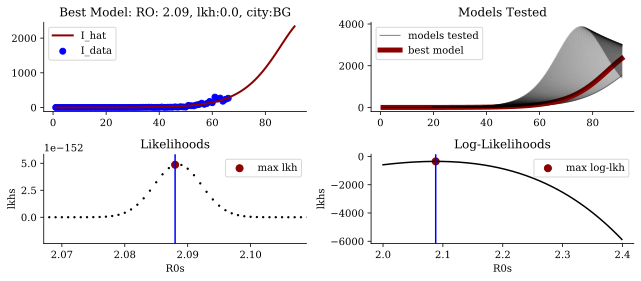

In [19]:
cal_with_mle('BG', plot = True)

# Calibration with MCMC

Here we propose calibration of beta using MCMC technique

C:\Users\Pc_User\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in log
  after removing the cwd from sys.path.
C:\Users\Pc_User\Anaconda3\lib\site-packages\ipykernel_launcher.py:47: RuntimeWarning: invalid value encountered in double_scalars


(0.0959207508667438, 0.32613965044567467, 0.3993794298115577)

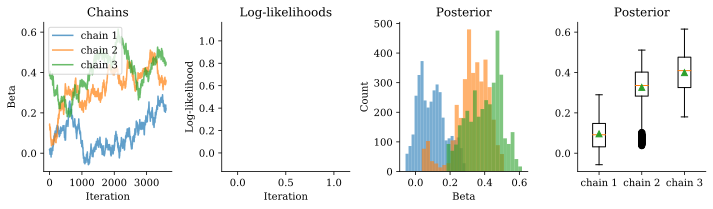

In [20]:
# Calibration with MCMC

alpha = 0.71
cd = 0.004
d = 7
gamma= 1/d - cd
N = int(susceptibles.loc[province])
y0 = N-1 ,1, 0, 0, 0 
ndays = len(provinces)
t = np.arange(1, ndays+1, 1)



# Parameter of the MCMC
std = 0.005
iterations = 4000



def metropolis_hastings(iterations, beta_start,gamma, std, true_data):
    

    alpha = 0.71
    
    RES = odeint(SEIRD_eq, y0, t, args=(beta_start, gamma, alpha, cd))
    S, E, I_hat, D, R = RES.T
    I_daily = (I_hat[1:]+R[1:] + D[1:])-(I_hat[:-1]+R[:-1] + D[:-1])
    llkh_start = compute_loglikelihood(true_data, I_daily)
    
    
    BETAS =[beta_start]
    llkh = [llkh_start]
    
    for ITER in range(iterations):
    
        beta_current = BETAS[-1]
        llkh_current = llkh[-1]

        beta_new = np.random.normal(beta_current, std, size = 1)
        RES = odeint(SEIRD_eq, y0, t, args=(beta_new, gamma, alpha, cd))
        S, E, I_hat, D, R = RES.T

    
        I_daily = (I_hat[1:]+R[1:] + D[1:])-(I_hat[:-1]+R[:-1] + D[:-1])
        llkh_new = compute_loglikelihood(true_data, I_daily)

        alpha  = np.e**(llkh_new - llkh_current)

        if alpha <= np.random.uniform(0,1): 
            BETAS.append(beta_current)
            llkh.append(llkh_current)

        else: 
            BETAS.append(beta_new)
            llkh.append(llkh_new)
      

    BETAS = BETAS[400:] 
    llkh = llkh[400:]
    
    return np.array(BETAS).flatten(), np.array(llkh).flatten()

true_data = provinces[:int(train["BG"])]["BG"]
BETAS_1, llkh_1 = metropolis_hastings(iterations, 0.2,gamma, std,true_data)  
BETAS_2, llkh_2 = metropolis_hastings(iterations, 0.1,gamma, std,true_data) 
BETAS_3, llkh_3= metropolis_hastings(iterations, 0.4,gamma, std,true_data)

B = [BETAS_1, BETAS_2, BETAS_3]
LLK = [llkh_1, llkh_2, llkh_3]

fig, axs = plt.subplots(1,4, facecolor='w', figsize=(10,3))


axs[0].set_title('Chains')
axs[1].set_title('Log-likelihoods')
axs[2].set_title('Posterior')
axs[3].set_title('Posterior')

for i in range(3):
    BETAS = B[i]
    llk = LLK[i]
    
    axs[0].plot(range(len(BETAS)), BETAS, label = 'chain {}'.format(i+1), alpha = 0.7)
    axs[1].plot(range(len(llk)), llk, alpha = 0.7)
    axs[2].hist(BETAS, bins = 20, alpha = 0.6)

axs[0].set_xlabel('Iteration')
axs[0].set_ylabel('Beta')

axs[1].set_xlabel('Iteration')
axs[1].set_ylabel('Log-likelihood')

axs[2].set_xlabel('Beta')
axs[2].set_ylabel('Count')

axs[3].boxplot(B, showmeans=True)
plt.setp(axs[3], xticklabels=['chain 1', 'chain 2', 'chain 3']);

axs[0].legend(fancybox = True)

for i in range(4):
    for spine in ('top', 'right'): 
        axs[i].spines[spine].set_visible(False)
        
fig.tight_layout()

np.mean(BETAS_1), np.mean(BETAS_2),  np.mean(BETAS_3)

## Exercise 2

In Exercise 2 we focus on bergamo city and we augment a simple SIR model with age structure

In [21]:
bergamo = provinces['BG']
bergamo.head()

0    0
1    0
2    0
3    0
4    0
Name: BG, dtype: int64

In [22]:
C = np.array(pd.read_csv('italian_matrix.csv').drop('Unnamed: 0', axis=1))
C

array([[ 3.47846672,  1.27669882,  0.36727204,  0.25644429,  0.22578405,
         0.61909022,  1.10741274,  1.35203679,  1.21753332,  0.6875326 ,
         0.54328462,  0.70409697,  0.50406611,  0.59660076,  0.43772939,
         0.39989175],
       [ 0.97145748,  9.12306631,  1.9310024 ,  0.23227981,  0.35476136,
         0.53767978,  0.76012379,  1.32073879,  1.62410396,  0.68902004,
         0.58013891,  0.42344935,  0.40690384,  0.44029942,  0.38558318,
         0.47398825],
       [ 0.22290792,  1.34367818, 14.61969784,  1.82540009,  0.64453729,
         0.4447102 ,  0.5776415 ,  0.96318192,  1.84496112,  1.37067521,
         0.83673098,  0.40837108,  0.18639196,  0.41038405,  0.35400783,
         0.37741643],
       [ 0.12274787,  0.25950287,  1.10010653, 16.74664847,  1.84184775,
         1.06220274,  0.50341409,  0.62858336,  1.23731722,  1.93921757,
         1.21104528,  0.64974186,  0.26190509,  0.05719587,  0.06807204,
         0.40963811],
       [ 0.90369338,  0.19897875,  0

We download from ISTAT population structure of Bergamo Province per age group, from which we derive the relative ratio of each age group by dividing by their sum. This way we will be able to multiply this vector by the number of susceptibles provided so that element j of the resulting vector will be the proportion of susceptibles of age group j.

In [23]:
bergamo_pop = np.array(
    [44919,53806,58019, 57315, 56548, 56457, 59736, 67105, 79922, 89918, 92599 ,84296, 70085, 62726,57835,116840]
)
bergamo_relative_pop = bergamo_pop / bergamo_pop.sum()

In [24]:
bergamo_relative_pop

array([0.040536  , 0.04855585, 0.05235776, 0.05172246, 0.0510303 ,
       0.05094818, 0.05390723, 0.06055719, 0.07212357, 0.0811442 ,
       0.0835636 , 0.07607077, 0.06324642, 0.05660548, 0.05219172,
       0.10543927])

In [25]:
bergamo_susceptibles = bergamo_relative_pop * int(susceptibles.loc['BG'])
bergamo[bergamo == 459] = 250

We choose that the first infected individual will belong to the age group 75+

In [26]:
# INITIALIZE POPULATION
d = 7
gamma = 1/d # 1 / average duration of infectious period (in days)    

t = np.arange(1, int(train['BG']))
N = sum(bergamo_susceptibles) # population size

I0 = np.zeros(len(bergamo_pop))
#age group 35-40 is number 7
I0[-1] = 1
S0 = bergamo_relative_pop * N - I0
R0 = np.zeros(len(I0))

#input 
INPUT = np.hstack((S0, I0, R0))

We develop the SIR function using array and broadcasting operations, without for loops. Then we test results with a random infectivity rate q = 0.024 that we will further calibrate

In [27]:
def SIR_agegroups(INPUT, t, C, q, gamma):
    S, I, R = np.split(INPUT, 3)
    dS_dt = - q * S * np.eye(len(S)) @ C @ (I / bergamo_susceptibles)
    dI_dt = + q * S * np.eye(len(S)) @ C @ (I / bergamo_susceptibles) - gamma * I
    dR_dt = gamma * I
    return np.hstack((dS_dt, dI_dt, dR_dt)) 

In [28]:
S, I, R = np.split(odeint(SIR_agegroups, INPUT, t, args=(C, 0.024, gamma)).T, 3)

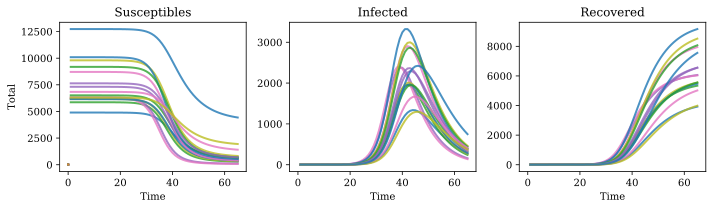

In [29]:
# Plot LOW VS HIgh 
fig, axs = plt.subplots(1, 3, sharex=True, facecolor='w', figsize=(10, 3))

state_names = ['Susceptibles', 'Infected', 'Recovered']
states = [S, I, R]
for j in range(3):
    for i in range(len(I)):
        axs[j].plot(t, states[j][i], i, alpha=0.8, lw=2, label = f'Age group {i}')     
    axs[j].set_xlabel('Time')
    axs[j].set_title(state_names[j])

axs[0].set_ylabel('Total')
fig.tight_layout()



In [30]:
R0s = np.arange(1, 3, 0.001) #We test Ro from 1 to 2 by 0.001 increase.

We now calibrate q

In [31]:
'''
5. Write a loop to test the different parameters:
   
   -compute the error with the MSE
'''
MSEs = []  # store all MSEs
I_hats = [] # store all the I_daily of the model that you test
qs = []

for R0 in R0s:
    q = R0 * gamma / round(np.max(la.eigvals(C)).real, 5)
    # Run the model over time 
    S, I, R = np.split(odeint(SIR_agegroups, INPUT, t, args=(C, q, gamma)).T, 3)
    I_hat = np.sum(I, axis=0)
    R = np.sum(R, axis=0)
    I_daily = (I_hat[1:]+R[1:])-(I_hat[:-1]+R[:-1])
    I_hats.append(I_daily)
    true_data = bergamo[:len(I_daily)]

    MSE = np.sqrt(sum((I_daily - true_data)**2)/len(true_data))
    MSEs.append(MSE)
    qs.append(q)

cal = pd.DataFrame({'R0': R0s, 'MSE': MSEs, 'I_hat': I_hats, 'q': qs})

best_model = cal.loc[cal['MSE'].idxmin()]
print('BEST MODEL RO: {}, MSE:{}, q:{}'.format(round(best_model['R0'], 2), round(best_model['MSE'],2), round(best_model['q'], 4)))

fig, axs = plt.subplots(1,3, facecolor='w', figsize=(10,3))
axs[0].set_title('Best Model: \n RO: {}, MSE:{}'.format(round(best_model['R0'], 2), round(best_model['MSE'],2)))
axs[0].scatter(t[:-1], bergamo[:len(I_daily)], color = 'b', label = 'I_data')
axs[0].plot(t[:-1] ,best_model['I_hat'], alpha=1, lw=2, label='I_daily', color = 'darkred')

axs[1].set_title('Models Tested')
axs[1].plot(t[:-1], I_hats[0], alpha=0.5,  color = 'k', lw=1, label ='models tested' )
for R0, I in zip(R0s, I_hats[1:]):
    if R0 == best_model['R0']:
        axs[1].plot(t[:-1], I, c = 'darkred', lw=5, label = 'best model')
    else:
        axs[1].plot(t[:-1], I, alpha=0.05,  color = 'k', lw=1)

axs[2].set_title('MSEs')
axs[2].scatter(cal['R0'], cal['MSE'], color = 'k' , s =1 )
axs[2].scatter(best_model['R0'], best_model['MSE'], color = 'darkred' , s =50, label='min MSE' )
axs[2].axvline(x= best_model['R0'], ymin=0, ymax=2, c= 'b')
axs[2].set_xlabel('R0s')
axs[2].set_ylabel('MSEs')

for i in range(3):
    axs[i].legend(fancybox = True)
    for spine in ('top', 'right'): 
        axs[i].spines[spine].set_visible(False)

fig.tight_layout()

BEST MODEL RO: 1.98, MSE:21.35, q:0.0135


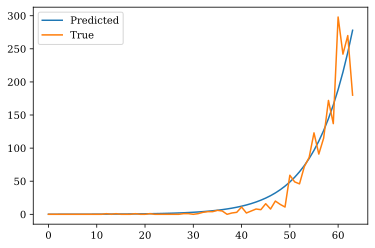

In [32]:
plt.plot(best_model['I_hat'], label='Predicted')
plt.plot(true_data, label='True')
plt.legend()

In [33]:
best_model_2 = best_model
q = best_model_2['q']

To calculate which age group is infected the most, we run the model with the calibrated parameters, and we compute a cumulated sum of the daily cases for each age group and we select the group with the highest cumulated sum at period corresponding to the train length size for Bergamo. For graphic purposes, the model was simulated for 200 time steps.

In [34]:
S, I, R = np.split(odeint(SIR_agegroups, INPUT, np.arange(1, 200), args=(C, best_model['q'], gamma)).T, 3)

In [35]:
I_daily = (I[:, 1:]+R[:, 1:])-(I[:, :-1]+R[:, :-1])

In [36]:
len(I)

16

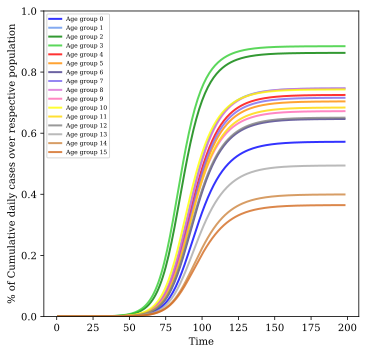

In [37]:
# Plot LOW VS HIgh 
fig, axs = plt.subplots(1, sharex=True, facecolor='w', figsize=(5, 5))

colors =  ['b', 'cornflowerblue', 'g', 'limegreen', 'r', 'darkorange', 'darkslateblue', 'mediumslateblue', 'orchid', 'hotpink',
          'yellow', 'gold', 'grey', 'darkgray', 'peru', 'chocolate']
for i in range(len(I)):
    axs.plot(np.arange(1, 199), np.cumsum(I_daily[i])/S0[i], colors[i], alpha=0.8, lw=2, label = f'Age group {i}')     

plt.ylim(0,1)
axs.set_xlabel('Time')
fig.tight_layout()
plt.ylabel('% of Cumulative daily cases over respective population')
plt.legend(prop={'size': 6})


Here we see that the most infected group is the 15-20 age range, if the infection started from the 35-40 group in the Bergamo province.

In [38]:
np.argmax((np.cumsum(I_daily, axis=1) / np.repeat(S0[:, None], 198, axis=1))[:, int(train['BG'])])

3

## Exercise 3

To analyze the impact of the restrictive measure implemented in Lombardy we will adopt two strategies with a minimum common denominator. In both cases we will implement the 3 following measures ordered by their order of implementation:

* School closing
* Quarantine
* Social distancing / Masks adoption / Behavioral Change

The first approach will be a deterministic approach.
We will either change q, or scale the whole contact matrix (the same thing but it changes from a theoretica perspective, or we will change only a part of the contact matrix

In the second approach will be stochastic where we will act on the transmission probability depending on the type of the measure.

### Deterministic approach

We choose the time period at which the intervention will happen

In [39]:
mascherina = 74
quarantena = 62
scuola = 57

In [40]:
# INITIALIZE POPULATION
d = 7
gamma = 1/d # 1 / average duration of infectious period (in days)    
t = np.arange(1, scuola)
N = sum(bergamo_susceptibles) # population size

I0 = np.zeros(len(bergamo_pop))
I0[-1] = 1
S0 = bergamo_relative_pop * N - I0
R00 = np.zeros(len(I0))
R0s = np.arange(1, 3, 0.01) #We test Ro from 1 to 2 by 0.001 increase.

#input 
INPUT = np.hstack((S0, I0, R00))

In [41]:
q = best_model_2['q']

For the first intervention (school closing) we decide the scale only the box of the contact matrix for the age groups 0-20 by assuming that only the contact among these classes is reduced.

We use our best q calibrated in the previous model for the data points up to 57 and then we calibrate a new 'scaling factor' which scales the contact matrix optimally minimizing the MSE.

BEST MODEL RO: 1.97, MSE:9.59, scaling:0.99


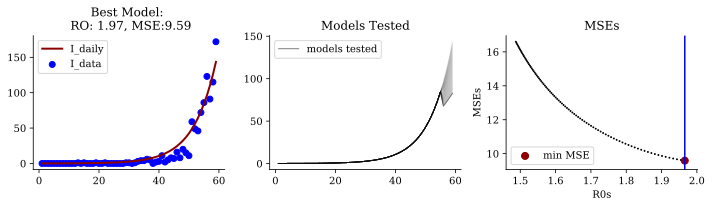

In [42]:
MSEs = []  # store all MSEs
I_hats = [] # store all the I_daily of the model that you test
R0s = []
scalings = []

for scaling in np.arange(0.1, 1, 0.01):
    # Run the model over time 
    t = np.arange(1, scuola)
    INPUT = np.hstack((S0, I0, R00))
    S_m, I_m, R_m = np.split(odeint(SIR_agegroups, INPUT, t, args=(C, q, gamma)).T, 3)
    
    
    INPUT = np.hstack((S_m[:, -1], I_m[:, -1], R_m[:, -1]))
    t = np.arange(scuola, quarantena)
    A = C.copy()
    A[:5, :5] *= scaling
    S_f, I_f, R_f= np.split(odeint(SIR_agegroups, INPUT, t, args=(A, q, gamma)).T, 3)
    #############
    
    S, I, R = np.hstack((S_m, S_f[:, 1:])), np.hstack((I_m, I_f[:, 1:])), np.hstack((R_m, R_f[:, 1:]))  
    ##
    R0 = q * round(np.max(la.eigvals(A)).real, 5) / gamma
    
    I_hat = np.sum(I, axis=0)
    R = np.sum(R, axis=0)
    I_daily = (I_hat[1:]+R[1:])-(I_hat[:-1]+R[:-1])
    I_hats.append(I_daily)
    true_data = bergamo[:len(I_daily)]

    
    MSE = np.sqrt(sum((I_daily - true_data)**2)/len(true_data))
    MSEs.append(MSE)
    R0s.append(R0)
    scalings.append(scaling)


t = np.arange(1, quarantena - 1)

cal = pd.DataFrame({'R0': R0s, 'MSE': MSEs, 'I_hat': I_hats, 'scale': scalings})

best_model = cal.loc[cal['MSE'].idxmin()]
print('BEST MODEL RO: {}, MSE:{}, scaling:{}'.format(round(best_model['R0'], 2), round(best_model['MSE'],2), round(best_model['scale'], 4)))

fig, axs = plt.subplots(1,3, facecolor='w', figsize=(10,3))
axs[0].set_title('Best Model: \n RO: {}, MSE:{}'.format(round(best_model['R0'], 2), round(best_model['MSE'],2)))
axs[0].scatter(t[:-1], bergamo[:len(I_daily)], color = 'b', label = 'I_data')
axs[0].plot(t[:-1] ,best_model['I_hat'], alpha=1, lw=2, label='I_daily', color = 'darkred')

axs[1].set_title('Models Tested')
axs[1].plot(t[:-1], I_hats[0], alpha=0.5,  color = 'k', lw=1, label ='models tested' )
for R0, I in zip(R0s, I_hats[1:]):
    if R0 == best_model['R0']:
        axs[1].plot(t[:-1], I, c = 'darkred', lw=5, label = 'best model')
    else:
        axs[1].plot(t[:-1], I, alpha=0.05,  color = 'k', lw=1)

axs[2].set_title('MSEs')
axs[2].scatter(cal['R0'], cal['MSE'], color = 'k' , s =1 )
axs[2].scatter(best_model['R0'], best_model['MSE'], color = 'darkred' , s =50, label='min MSE' )
axs[2].axvline(x= best_model['R0'], ymin=0, ymax=2, c= 'b')
axs[2].set_xlabel('R0s')
axs[2].set_ylabel('MSEs')

for i in range(3):
    axs[i].legend(fancybox = True)
    for spine in ('top', 'right'): 
        axs[i].spines[spine].set_visible(False)

fig.tight_layout()

MSE decreased by half! The partial scale of the contact matrix seems to work

In [43]:
scal_best = best_model['scale']
A = C.copy()
A[:5, :5] *= scal_best

In [44]:
# INITIALIZE POPULATION
gamma = 1/d # 1 / average duration of infectious period (in days)    
t = np.arange(1, scuola)
N = sum(bergamo_susceptibles) # population size

I0 = np.zeros(len(bergamo_pop))
I0[-1] = 1
S0 = bergamo_relative_pop * N - I0
R00 = np.zeros(len(I0))
R0s = np.arange(1, 3, 0.1) #We test Ro from 1 to 2 by 0.001 increase.

#input 
INPUT = np.hstack((S0, I0, R00))

We now decide to do the same for the second intervention with the same rationale: we keep fixed the 'partial scale' of the contact matrix trained in the first 2 parts of the data (0-57, 57-62) and we train on the third part (62-74) a new coefficient that fully scales the contact matrix

In [45]:
S_m, I_m, R_m = np.split(odeint(SIR_agegroups, INPUT, t, args=(C, q, gamma)).T, 3)

In [46]:
INPUT = np.hstack((S_m[:, -1], I_m[:, -1], R_m[:, -1]))
t = np.arange(scuola, quarantena)
S_f, I_f, R_f= np.split(odeint(SIR_agegroups, INPUT, t, args=(A, q, gamma)).T, 3)

In [47]:
S_2, I_2, R_2 = np.hstack((S_m, S_f[:, 1:])), np.hstack((I_m, I_f[:, 1:])), np.hstack((R_m, R_f[:, 1:]))

BEST MODEL RO: 1.66, MSE:27.44, scaling:0.84


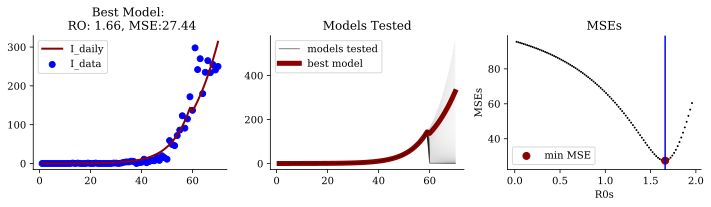

In [48]:
MSEs = []  # store all MSEs
I_hats = [] # store all the I_daily of the model that you test
R0s = []
scalings_qua = []
t = np.arange(quarantena, mascherina)


for scaling in np.arange(0.01, 1, 0.01):
    # Run the model over time 
    INPUT = np.hstack((S_2[:, -1], I_2[:, -1], R_2[:, -1]))
    
    S_q, I_q, R_q = np.split(odeint(SIR_agegroups, INPUT, t, args=(scaling * C, q, gamma)).T, 3)
    
    S, I, R = np.hstack((S_2, S_q[:, 1:])), np.hstack((I_2, I_q[:, 1:])), np.hstack((R_2, R_q[:, 1:]))
    R0 = q * round(np.max(la.eigvals(scaling * C)).real, 5) / gamma
    
    I_hat = np.sum(I, axis=0)
    R = np.sum(R, axis=0)
    I_daily = (I_hat[1:]+R[1:])-(I_hat[:-1]+R[:-1])
    I_hats.append(I_daily)
    true_data = bergamo[:len(I_daily)]

    
    MSE = np.sqrt(sum((I_daily - true_data)**2)/len(true_data))
    MSEs.append(MSE)
    R0s.append(R0)
    scalings_qua.append(scaling)


t = np.arange(1, mascherina - 2)

cal = pd.DataFrame({'R0': R0s, 'MSE': MSEs, 'I_hat': I_hats, 'scale': scalings_qua})

best_model = cal.loc[cal['MSE'].idxmin()]
print('BEST MODEL RO: {}, MSE:{}, scaling:{}'.format(round(best_model['R0'], 2), round(best_model['MSE'],2), round(best_model['scale'], 4)))

fig, axs = plt.subplots(1,3, facecolor='w', figsize=(10,3))
axs[0].set_title('Best Model: \n RO: {}, MSE:{}'.format(round(best_model['R0'], 2), round(best_model['MSE'],2)))
axs[0].scatter(t[:-1], bergamo[:len(I_daily)], color = 'b', label = 'I_data')
axs[0].plot(t[:-1] ,best_model['I_hat'], alpha=1, lw=2, label='I_daily', color = 'darkred')

axs[1].set_title('Models Tested')
axs[1].plot(t[:-1], I_hats[0], alpha=0.5,  color = 'k', lw=1, label ='models tested' )
for R0, I in zip(R0s, I_hats[1:]):
    if R0 == best_model['R0']:
        axs[1].plot(t[:-1], I, c = 'darkred', lw=5, label = 'best model')
    else:
        axs[1].plot(t[:-1], I, alpha=0.05,  color = 'k', lw=1)

axs[2].set_title('MSEs')
axs[2].scatter(cal['R0'], cal['MSE'], color = 'k' , s =1 )
axs[2].scatter(best_model['R0'], best_model['MSE'], color = 'darkred' , s =50, label='min MSE' )
axs[2].axvline(x= best_model['R0'], ymin=0, ymax=2, c= 'b')
axs[2].set_xlabel('R0s')
axs[2].set_ylabel('MSEs')

for i in range(3):
    axs[i].legend(fancybox = True)
    for spine in ('top', 'right'): 
        axs[i].spines[spine].set_visible(False)

fig.tight_layout()

Finally, we do the same on the final intervention (like masks). The rational is now to not scale the contact matrix as technically now the masks don't reduce the contact but, given the portion of infected people to which susceptibles, what is reduced is the rate at which the susceptibles get infected (so q)

In [49]:
# INITIALIZE POPULATION
gamma = 1/d # 1 / average duration of infectious period (in days)    
t = np.arange(1, scuola)
N = sum(bergamo_susceptibles) # population size

I0 = np.zeros(len(bergamo_pop))
I0[-1] = 1
S0 = bergamo_relative_pop * N - I0
R00 = np.zeros(len(I0))
R0s = np.arange(1, 3, 0.1) #We test Ro from 1 to 2 by 0.001 increase.

#input 
INPUT = np.hstack((S0, I0, R00))

In [50]:
best_scaling = best_model['scale']

In [51]:
S_m, I_m, R_m = np.split(odeint(SIR_agegroups, INPUT, t, args=(C, q, gamma)).T, 3)

In [52]:
INPUT = np.hstack((S_m[:, -1], I_m[:, -1], R_m[:, -1]))
t = np.arange(scuola, quarantena)
S_f, I_f, R_f= np.split(odeint(SIR_agegroups, INPUT, t, args=(A, q, gamma)).T, 3)

In [53]:
S_2, I_2, R_2 = np.hstack((S_m, S_f[:, 1:])), np.hstack((I_m, I_f[:, 1:])), np.hstack((R_m, R_f[:, 1:]))

In [54]:
INPUT = np.hstack((S_2[:, -1], I_2[:, -1], R_2[:, -1]))
t = np.arange(quarantena, mascherina)

In [55]:
S_q, I_q, R_q = np.split(odeint(SIR_agegroups, INPUT, t, args=(best_scaling * C, q, gamma)).T, 3)

S_ma, I_ma, R_ma = np.hstack((S_2, S_q[:, 1:])), np.hstack((I_2, I_q[:, 1:])), np.hstack((R_2, R_q[:, 1:]))

BEST MODEL RO: 0.85, MSE:39.22, q:0.0069


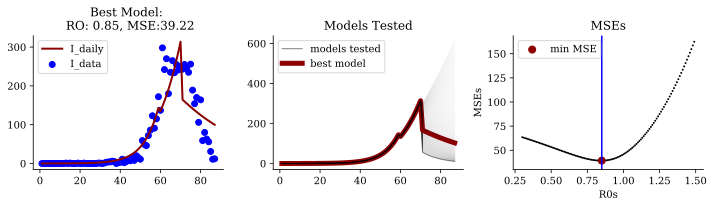

In [56]:
MSEs = []  # store all MSEs
I_hats = [] # store all the I_daily of the model that you test
R0s = np.arange(0.3, 1.5, 0.01)
qs = []
t = np.arange(mascherina, 92)

for R0 in R0s:
    q = R0 * gamma / round(np.max(la.eigvals(best_scaling * C)).real, 5)
    # Run the model over time 
    INPUT = np.hstack((S_ma[:, -1], I_ma[:, -1], R_ma[:, -1]))
    
    S_end, I_end, R_end = np.split(odeint(SIR_agegroups, INPUT, t, args=(best_scaling * C, q, gamma)).T, 3)
    
    S, I, R = np.hstack((S_ma, S_end[:, 1:])), np.hstack((I_ma, I_end[:, 1:])), np.hstack((R_ma, R_end[:, 1:]))
    
    I_hat = np.sum(I, axis=0)
    R = np.sum(R, axis=0)
    I_daily = (I_hat[1:]+R[1:])-(I_hat[:-1]+R[:-1])
    I_hats.append(I_daily)
    true_data = bergamo[:len(I_daily)]

    
    MSE = np.sqrt(sum((I_daily - true_data)**2)/len(true_data))
    MSEs.append(MSE)
    qs.append(q)


t = np.arange(1, 89)

cal = pd.DataFrame({'R0': R0s, 'MSE': MSEs, 'I_hat': I_hats, 'scale': qs})

best_model = cal.loc[cal['MSE'].idxmin()]
print('BEST MODEL RO: {}, MSE:{}, q:{}'.format(round(best_model['R0'], 2), round(best_model['MSE'],2), round(best_model['scale'], 4)))

fig, axs = plt.subplots(1,3, facecolor='w', figsize=(10,3))
axs[0].set_title('Best Model: \n RO: {}, MSE:{}'.format(round(best_model['R0'], 2), round(best_model['MSE'],2)))
axs[0].scatter(t[:-1], bergamo[:len(I_daily)], color = 'b', label = 'I_data')
axs[0].plot(t[:-1] ,best_model['I_hat'], alpha=1, lw=2, label='I_daily', color = 'darkred')

axs[1].set_title('Models Tested')
axs[1].plot(t[:-1], I_hats[0], alpha=0.5,  color = 'k', lw=1, label ='models tested' )
for R0, I in zip(R0s, I_hats[1:]):
    if R0 == best_model['R0']:
        axs[1].plot(t[:-1], I, c = 'darkred', lw=5, label = 'best model')
    else:
        axs[1].plot(t[:-1], I, alpha=0.05,  color = 'k', lw=1)

axs[2].set_title('MSEs')
axs[2].scatter(cal['R0'], cal['MSE'], color = 'k' , s =1 )
axs[2].scatter(best_model['R0'], best_model['MSE'], color = 'darkred' , s =50, label='min MSE' )
axs[2].axvline(x= best_model['R0'], ymin=0, ymax=2, c= 'b')
axs[2].set_xlabel('R0s')
axs[2].set_ylabel('MSEs')

for i in range(3):
    axs[i].legend(fancybox = True)
    for spine in ('top', 'right'): 
        axs[i].spines[spine].set_visible(False)

fig.tight_layout()

We now take the aggregrate prediction and we compute a 5 step moving average and we plot the results together with the intervention time. We are not satisfied and we proceed with a stochastic approach

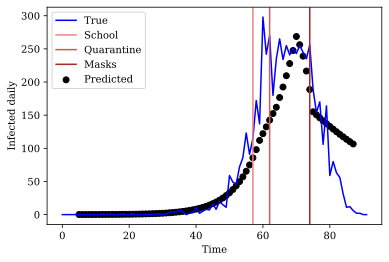

In [57]:
plt.clf()
plt.scatter(x = np.arange(1, 88), y=pd.DataFrame(best_model['I_hat']).rolling(window=5).mean(), 
            label='Predicted', color='black')
plt.plot(bergamo, label='True', color='blue')
plt.xlabel('Time')
plt.ylabel('Infected daily')
plt.axvline(scuola, label='School', color='lightcoral')
plt.axvline(quarantena, label='Quarantine', color='indianred')
plt.axvline(mascherina, label='Masks', color='brown')
plt.legend()


### Stochastic approach

We now introduce some stochasticity in the model, by randomizing the probability at which susceptibles get infected using the bernoulli distribution. We adapt the code provided to our age group structure by making it adaptable to matrix-vector operations using broadcasting operations

In [58]:
def computeTransitions(popoulation_at_risk, event_rate, time_step):
    if isinstance(event_rate, float):
        event_rate = np.ones(len(popoulation_at_risk)) * event_rate
    p = event_rate * time_step
    n_of_events = np.random.binomial(popoulation_at_risk.astype(int), p, len(p))
    return (n_of_events)

In [59]:
q = best_model_2['q'] * 2
q

0.0270335905695007

In [60]:
'''
b. The SIR model

nb. we do not use ode int but for more clearness we compute the SIR dynamics in a loop
'''
def SIR(S0,I0,R0, transmission_rate , recovery_rate, ndays , steps_per_day, q, restrictions=False):
    N = S0 + I0 + R0 
    S = np.array([S0])
    I = np.array([I0])
    R = np.array([R0])
    time_step = 1/steps_per_day 
    t = np.arange(0, ndays, time_step)
    
    for i in t:        
        if restrictions:
            #social distance
            if i == t[(len(t) // 4) * 3]:
                q -= social_distance
               
        lambda_ = q * beta @ (I[-1]/N)
        
        if restrictions:
            #schools
            if i >= t[len(t) // 4]:
                lambda_[:5] *= schools
            #quarantine
            if i >= t[(len(t) // 4) * 2]:
                lambda_ *= quarantine          
    
        if lambda_.any() & ( S[-1] >0).any():
            new_infections = computeTransitions( S[-1] ,lambda_,time_step)
        elif lambda_.any() | ( S[-1] >0).any():
            new_infections = np.zeros(len(S[-1]))

        # new recoveries are possible only if I>0
        if(I[-1]>0).any():
            new_recoveries = computeTransitions(I[-1], gamma ,time_step)
        else:
            new_recoveries= np.zeros(len(I[-1]))

        # control that new infections do not exceed available susceptibles
        new_infections[new_infections > S[-1]] = S[-1][new_infections > S[-1]]

        # control that new recoveries do not exceed available infected individuals
        new_recoveries[new_recoveries > I[-1]] = I[-1][new_recoveries > I[-1]]

        S = np.append(S, np.array([S[-1]]) - new_infections, axis=0)
        I = np.append(I, np.array([I[-1]]) + new_infections - new_recoveries, axis=0)
        R = np.append(R, np.array([R[-1]]) + new_recoveries, axis=0)
    return S , I , R 


In [61]:
gamma= 1/8
beta = C 

N = bergamo_pop
R0 = np.zeros(len(I0))
ndays = 100
steps_per_day = 10

In [62]:
'''
d. We run 50 simulations to se how stochasticity  effects our model output 
'''
nsim=50
Ss = []
Is= []
Rs = []
for isim in range(1,nsim+1):
    sys.stdout.write('\rSimulation n°: {}'.format(isim))
    S,I,R = SIR(S0,I0,R0, gamma, beta, ndays, steps_per_day, q)
    Ss.append(S)
    Is.append(I)
    Rs.append(R)
print('\nDone!')   

Simulation n°: 50
Done!


In [63]:
'''
e. Compute mean and sd of our simulations
'''

meanS = np.mean(np.array(Ss), axis=0)[:-1, -1]
meanI = np.mean(np.array(Is), axis=0)[:-1, -1]
meanR = np.mean(np.array(Rs), axis=0)[:-1, -1]

sdS = np.std(Ss, axis=0, dtype=np.float64)[:-1, -1]
sdI = np.std(Is, axis=0, dtype=np.float64)[:-1, -1]
sdR = np.std(Rs, axis=0, dtype=np.float64)[:-1, -1]

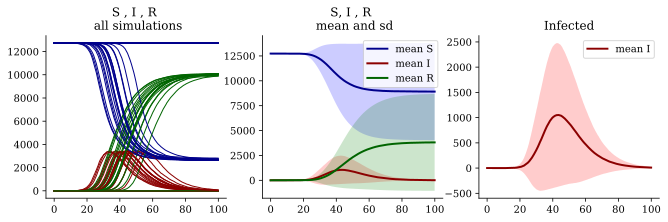

In [64]:
'''
e. Some Plots
'''
t = np.arange(0, ndays, 1/steps_per_day)
fig, axs = plt.subplots(1,3, facecolor='w', figsize=(11,3))

axs[0].set_title('S , I , R \n all simulations')
for  S, I,R in zip(Ss, Is, Rs):
    axs[0].plot(t, S[:-1, -1], c = 'darkblue', lw=1)
    axs[0].plot(t, I[:-1, -1], c = 'darkred', lw=1)
    axs[0].plot(t, R[:-1, -1], c = 'darkgreen', lw=1)


axs[1].set_title('S, I , R \n mean and sd')
axs[1].plot(t, meanS, c = 'darkblue', lw=2, label = 'mean S')
axs[1].plot(t, meanI, c = 'darkred', lw=2, label = 'mean I')
axs[1].plot(t, meanR, c = 'darkgreen', lw=2, label = 'mean R')
axs[1].fill_between(t, meanS+sdS, meanS-sdS, facecolor='blue', alpha=0.2)
axs[1].fill_between(t, meanI+sdI, meanI-sdI, facecolor='r', alpha=0.2)
axs[1].fill_between(t, meanR+sdR, meanR-sdR, facecolor='g', alpha=0.2)
axs[1].legend(fancybox = True)


axs[2].set_title('Infected')
axs[2].plot(t, meanI, c = 'darkred', lw=2, label = 'mean I')
axs[2].fill_between(t, meanI+sdI, meanI-sdI, facecolor='r', alpha=0.2)
axs[2].legend(fancybox = True)
    
for i in range(3):
    #axs[i].legend(fancybox = True)
    for spine in ('top', 'right'): 
        axs[i].spines[spine].set_visible(False)

With the same rational as before we now implement restrictions by scaling the probability of transmission 'event_rate'. As schools close, only the first 4 elements of the vector 'event rate' are scaled (age groups 0-20), whereas as quarantine is enforeced, all the vector is scaled. Finally with social distancing/masks, we act only on q, as before. The whole procedure happens with pre-defined constants

In [65]:
schools = 0.2
quarantine = 0.4
social_distance = 0.007

In [66]:
nsim=50
Ss = []
Is= []
Rs = []
for isim in range(1,nsim+1):
    sys.stdout.write('\rSimulation n°: {}'.format(isim))
    S,I,R = SIR(S0,I0,R0, gamma, beta, ndays, steps_per_day, q, restrictions=True)
    Ss.append(S)
    Is.append(I)
    Rs.append(R)
print('\nDone!')   

Simulation n°: 50
Done!


We plot the result only for the oldest age group and we compare it with one affected by the first measure

In [67]:
meanS = np.mean(Ss, axis=0)[:-1, -1]
meanI = np.mean(Is, axis=0)[:-1, -1]
meanR = np.mean(Rs, axis=0)[:-1, -1]

sdS = np.std(Ss, axis=0, dtype=np.float64)[:-1, -1]
sdI = np.std(Is, axis=0, dtype=np.float64)[:-1, -1]
sdR = np.std(Rs, axis=0, dtype=np.float64)[:-1, -1]

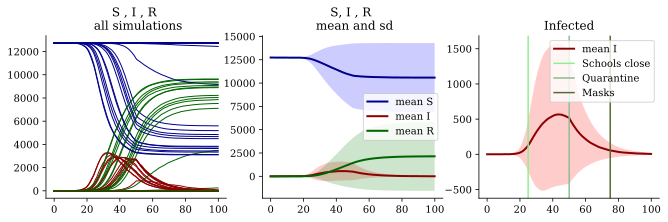

In [68]:
t = np.arange(0, ndays, 1/steps_per_day)
fig, axs = plt.subplots(1,3, facecolor='w', figsize=(11,3))

axs[0].set_title('S , I , R \n all simulations')
for  S, I,R in zip(Ss, Is, Rs):
    axs[0].plot(t, S[:-1, -1], c = 'darkblue', lw=1)
    axs[0].plot(t, I[:-1, -1], c = 'darkred', lw=1)
    axs[0].plot(t, R[:-1, -1], c = 'darkgreen', lw=1)


axs[1].set_title('S, I , R \n mean and sd')
axs[1].plot(t, meanS, c = 'darkblue', lw=2, label = 'mean S')
axs[1].plot(t, meanI, c = 'darkred', lw=2, label = 'mean I')
axs[1].plot(t, meanR, c = 'darkgreen', lw=2, label = 'mean R')
axs[1].fill_between(t, meanS+sdS, meanS-sdS, facecolor='blue', alpha=0.2)
axs[1].fill_between(t, meanI+sdI, meanI-sdI, facecolor='r', alpha=0.2)
axs[1].fill_between(t, meanR+sdR, meanR-sdR, facecolor='g', alpha=0.2)
axs[1].legend(fancybox = True)


axs[2].set_title('Infected')
axs[2].plot(t, meanI, c = 'darkred', lw=2, label = 'mean I')
axs[2].fill_between(t, meanI+sdI, meanI-sdI, facecolor='r', alpha=0.2)
axs[2].axvline(25, label='Schools close', color='lightgreen')
axs[2].axvline(50, label='Quarantine', color='darkseagreen')
axs[2].axvline(75, label='Masks', color='darkolivegreen')
axs[2].legend(fancybox = True)
    
for i in range(3):
    #axs[i].legend(fancybox = True)
    for spine in ('top', 'right'): 
        axs[i].spines[spine].set_visible(False)

In [69]:
meanS_3 = np.mean(Ss, axis=0)[:-1, 3] * 100 / bergamo_susceptibles[3] 
meanI_3 = np.mean(Is, axis=0)[:-1, 3] * 100 / bergamo_susceptibles[3]
meanR_3 = np.mean(Rs, axis=0)[:-1, 3] * 100 / bergamo_susceptibles[3]

sdS_3 = np.std(Ss, axis=0, dtype=np.float64)[:-1, 3] * 100 / bergamo_susceptibles[3]
sdI_3 = np.std(Is, axis=0, dtype=np.float64)[:-1, 3] * 100 / bergamo_susceptibles[3]
sdR_3 = np.std(Rs, axis=0, dtype=np.float64)[:-1, 3] * 100 / bergamo_susceptibles[3]

In [70]:
meanS_75 = np.mean(Ss, axis=0)[:-1, -1] * 100 / bergamo_susceptibles[-1] 
meanI_75 = np.mean(Is, axis=0)[:-1, -1] * 100 / bergamo_susceptibles[-1]
meanR_75 = np.mean(Rs, axis=0)[:-1, -1] * 100 / bergamo_susceptibles[-1]

sdS_75 = np.std(Ss, axis=0, dtype=np.float64)[:-1, -1] * 100 / bergamo_susceptibles[-1]
sdI_75 = np.std(Is, axis=0, dtype=np.float64)[:-1, -1] * 100/ bergamo_susceptibles[-1]
sdR_75 = np.std(Rs, axis=0, dtype=np.float64)[:-1, -1] * 100/ bergamo_susceptibles[-1]

Text(0.5, 0, 'Time')

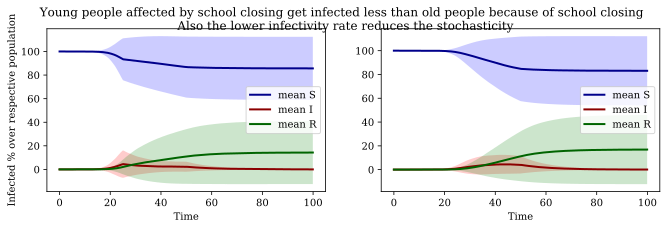

In [71]:
fig, axs = plt.subplots(1,2, facecolor='w', figsize=(11,3))

plt.suptitle('Young people affected by school closing get infected less than old people because of school closing \n Also the lower infectivity rate reduces the stochasticity')
axs[0].plot(t, meanS_3, c = 'darkblue', lw=2, label = 'mean S')
axs[0].plot(t, meanI_3, c = 'darkred', lw=2, label = 'mean I')
axs[0].plot(t, meanR_3, c = 'darkgreen', lw=2, label = 'mean R')
axs[0].fill_between(t, meanS_3+sdS_3, meanS_3-sdS_3, facecolor='blue', alpha=0.2)
axs[0].fill_between(t, meanI_3+sdI_3, meanI_3-sdI_3, facecolor='r', alpha=0.2)
axs[0].fill_between(t, meanR_3+sdR_3, meanR_3-sdR_3, facecolor='g', alpha=0.2)
axs[0].legend(fancybox = True)
axs[0].set_xlabel('Time')
axs[0].set_ylabel('Infected % over respective population')

axs[1].plot(t, meanS_75, c = 'darkblue', lw=2, label = 'mean S')
axs[1].plot(t, meanI_75, c = 'darkred', lw=2, label = 'mean I')
axs[1].plot(t, meanR_75, c = 'darkgreen', lw=2, label = 'mean R')
axs[1].fill_between(t, meanS_75+sdS_75, meanS_75-sdS_75, facecolor='blue', alpha=0.2)
axs[1].fill_between(t, meanI_75+sdI_75, meanI_75-sdI_75, facecolor='r', alpha=0.2)
axs[1].fill_between(t, meanR_75+sdR_75, meanR_75-sdR_75, facecolor='g', alpha=0.2)
axs[1].legend(fancybox = True)
axs[1].set_xlabel('Time')


We know investigate the result by averaging per age group and we realize that the plots are almost symmetrical but with a huge difference concerning standard deviations

In [72]:
meanS = np.mean(np.mean(Ss, axis=0)[:-1], axis=1)
meanI = np.mean(np.mean(Is, axis=0)[:-1], axis=1)
meanR = np.mean(np.mean(Rs, axis=0)[:-1], axis=1)

sdS = np.mean(np.std(Ss, axis=0, dtype=np.float64)[:-1], axis=1)
sdI = np.mean(np.std(Is, axis=0, dtype=np.float64)[:-1], axis=1)
sdR = np.mean(np.std(Rs, axis=0, dtype=np.float64)[:-1], axis=1)

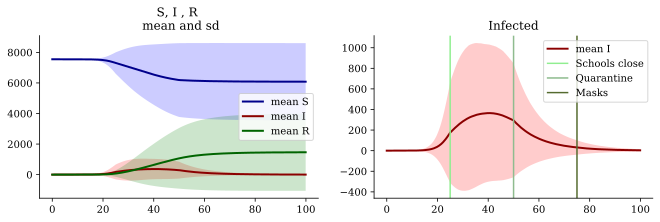

In [73]:
t = np.arange(0, ndays, 1/steps_per_day)
fig, axs = plt.subplots(1,2, facecolor='w', figsize=(11,3))


axs[0].set_title('S, I , R \n mean and sd')
axs[0].plot(t, meanS, c = 'darkblue', lw=2, label = 'mean S')
axs[0].plot(t, meanI, c = 'darkred', lw=2, label = 'mean I')
axs[0].plot(t, meanR, c = 'darkgreen', lw=2, label = 'mean R')
axs[0].fill_between(t, meanS+sdS, meanS-sdS, facecolor='blue', alpha=0.2)
axs[0].fill_between(t, meanI+sdI, meanI-sdI, facecolor='r', alpha=0.2)
axs[0].fill_between(t, meanR+sdR, meanR-sdR, facecolor='g', alpha=0.2)
axs[0].legend(fancybox = True)


axs[1].set_title('Infected')
axs[1].plot(t, meanI, c = 'darkred', lw=2, label = 'mean I')
axs[1].fill_between(t, meanI+sdI, meanI-sdI, facecolor='r', alpha=0.2)
axs[1].axvline(25, label='Schools close', color='lightgreen')
axs[1].axvline(50, label='Quarantine', color='darkseagreen')
axs[1].axvline(75, label='Masks', color='darkolivegreen')
axs[1].legend(fancybox = True)
    
for i in range(2):
    #axs[i].legend(fancybox = True)
    for spine in ('top', 'right'): 
        axs[i].spines[spine].set_visible(False)